# Inspect the single-lineage model run on the colorectal data (005)

Model attributes:

- sgRNA | gene varying intercept
- RNA and CN varying effects per gene
- correlation between gene varying effects modeled using the multivariate normal and Cholesky decomposition (non-centered parameterization)
- target gene mutation variable and cancer gene comutation variable.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from time import time

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from IPython.display import Markdown, display

In [3]:
from speclet.analysis.arviz_analysis import extract_coords_param_names
from speclet.bayesian_models.lineage_hierarchical_nb import LineageHierNegBinomModel
from speclet.data_processing.common import head_tail
from speclet.io import modeling_data_dir, models_dir
from speclet.managers.data_managers import CrisprScreenDataManager
from speclet.plot import set_speclet_theme
from speclet.project_configuration import arviz_config

In [4]:
# Notebook execution timer.
notebook_tic = time()

# Plotting setup.
set_speclet_theme()
%config InlineBackend.figure_format = "retina"
arviz_config()

## Data

In [5]:
saved_model_dir = models_dir() / "hnb-single-lineage-colorectal-005_PYMC_NUMPYRO"

In [6]:
with open(saved_model_dir / "description.txt") as f:
    model_description = "".join(list(f))

print(model_description)

name: 'hnb-single-lineage-colorectal-005'
fit method: 'PYMC_NUMPYRO'

--------------------------------------------------------------------------------

CONFIGURATION

{
    "name": "hnb-single-lineage-colorectal-005",
    "description": " Single lineage hierarchical negative binomial model for colorectal data from the Broad. The number of cancer genes has been limited by having to be mutated in at least 25% of cell lines. I have also increased the number of tuning steps from 1,000 to 2,000 and increased the target acceptance probability to 0.99. ",
    "active": true,
    "model": "LINEAGE_HIERARCHICAL_NB",
    "data_file": "modeling_data/lineage-modeling-data/depmap-modeling-data_colorectal.csv",
    "model_kwargs": {
        "lineage": "colorectal",
        "min_frac_cancer_genes": 0.2
    },
    "sampling_kwargs": {
        "pymc_mcmc": null,
        "pymc_advi": null,
        "pymc_numpyro": {
            "draws": 1000,
            "tune": 2000,
            "chains": 4,
           

### Load posterior summary

In [7]:
crc_post_summary = pd.read_csv(saved_model_dir / "posterior-summary.csv").assign(
    var_name=lambda d: [x.split("[")[0] for x in d["parameter"]]
)
crc_post_summary.head()

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
0,mu_mu_a,0.119,0.001,0.118,0.121,0.000,0.000,24.0,2247.0,1.12,mu_mu_a
1,mu_b,-0.000,0.001,-0.001,0.001,0.000,0.000,7.0,35.0,1.53,mu_b
2,mu_d,-0.022,0.001,-0.023,-0.021,0.000,0.000,7.0,35.0,1.53,mu_d
3,sigma_a,0.149,0.058,0.048,0.184,0.029,0.022,7.0,11.0,1.60,sigma_a
4,alpha,7.470,0.671,6.302,7.870,0.334,0.256,7.0,11.0,1.59,alpha


### Load trace object

In [53]:
trace_file = saved_model_dir / "posterior.netcdf"
assert trace_file.exists()
trace = az.from_netcdf(trace_file)

### Colorectal data

In [9]:
def _broad_only(df: pd.DataFrame) -> pd.DataFrame:
    return df[df["screen"] == "broad"].reset_index(drop=True)


crc_dm = CrisprScreenDataManager(
    modeling_data_dir()
    / "lineage-modeling-data"
    / "depmap-modeling-data_colorectal.csv",
    transformations=[_broad_only],
)

In [10]:
crc_data = crc_dm.get_data(read_kwargs={"low_memory": False})
crc_data.head()

,sgrna,replicate_id,lfc,p_dna_batch,genome_alignment,hugo_symbol,screen,multiple_hits_on_gene,sgrna_target_chr,sgrna_target_pos,...,any_deleterious,any_tcga_hotspot,any_cosmic_hotspot,is_mutated,copy_number,lineage,lineage_subtype,primary_or_metastasis,is_male,age
0,AAAGCCCAGGAGTATGGGAG,LS513-311Cas9_RepA_p6_batch2,0.594321,2,chr2_130522105_-,CFC1B,broad,True,2,130522105,...,NaN,NaN,NaN,False,0.951337,colorectal,colorectal_adenocarcinoma,primary,True,63.0
1,AAATCAGAGAAACCTGAACG,LS513-311Cas9_RepA_p6_batch2,-0.363633,2,chr11_89916950_-,TRIM49D1,broad,True,11,89916950,...,NaN,NaN,NaN,False,0.945508,colorectal,colorectal_adenocarcinoma,primary,True,63.0
2,AACGTCTTTGAAGAAAGCTG,LS513-311Cas9_RepA_p6_batch2,-0.001343,2,chr5_71055421_-,GTF2H2,broad,True,5,71055421,...,NaN,NaN,NaN,False,1.428663,colorectal,colorectal_adenocarcinoma,primary,True,63.0
3,AACGTCTTTGAAGGAAGCTG,LS513-311Cas9_RepA_p6_batch2,0.367220,2,chr5_69572480_+,GTF2H2C,broad,True,5,69572480,...,NaN,NaN,NaN,False,1.428663,colorectal,colorectal_adenocarcinoma,primary,True,63.0
4,AAGAGGTTCCAGACTACTTA,LS513-311Cas9_RepA_p6_batch2,-1.180029,2,chrX_155898173_+,VAMP7,broad,True,X,155898173,...,NaN,NaN,NaN,False,0.466222,colorectal,colorectal_adenocarcinoma,primary,True,63.0


### Single lineage model

In [11]:
crc_model = LineageHierNegBinomModel(lineage="colorectal", min_frac_cancer_genes=0.2)

In [12]:
valid_crc_data = crc_model.data_processing_pipeline(crc_data.copy())
crc_model_data = crc_model.make_data_structure(valid_crc_data)

[08/02/22 11:38:26] INFO     Processing data for modeling.     ]8;id=662106;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=591347;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#273\273]8;;\

                    INFO     LFC limits: (-5.0, 5.0)           ]8;id=594525;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=535887;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#274\274]8;;\

[08/02/22 11:40:28] WARNING  number of data points dropped: 25 ]8;id=630776;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=756927;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#325\325]8;;\

[08/02/22 11:40:30] INFO     number of genes mutated in all    ]8;id=390729;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=579662;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#478\478]8;;\
                             cells lines: 0                                                  

[08/02/22 11:40:34] INFO     Dropping 21 cancer genes.         ]8;id=132305;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=519051;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#534\534]8;;\

In [13]:
crc_model_data.coords["cancer_gene"]

['APC', 'AXIN2', 'B2M', 'FBXW7', 'KRAS', 'MSH6', 'PIK3CA', 'POLD1', 'UBR5']

## Analysis

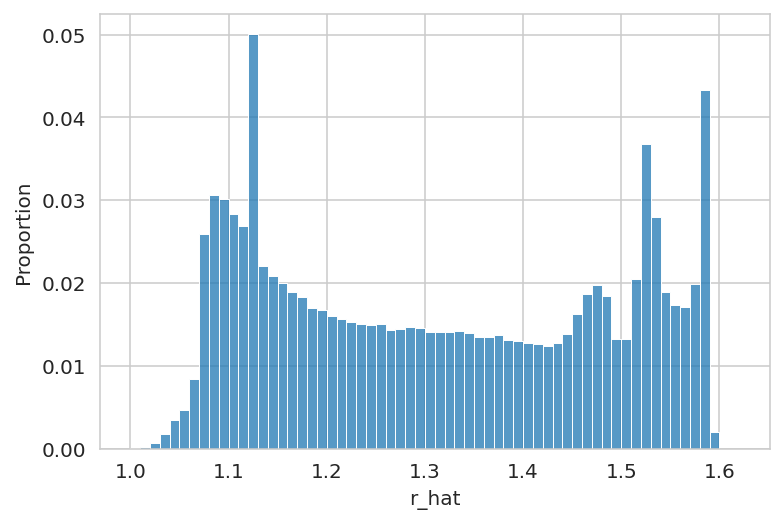

In [14]:
sns.histplot(x=crc_post_summary["r_hat"], binwidth=0.01, stat="proportion");

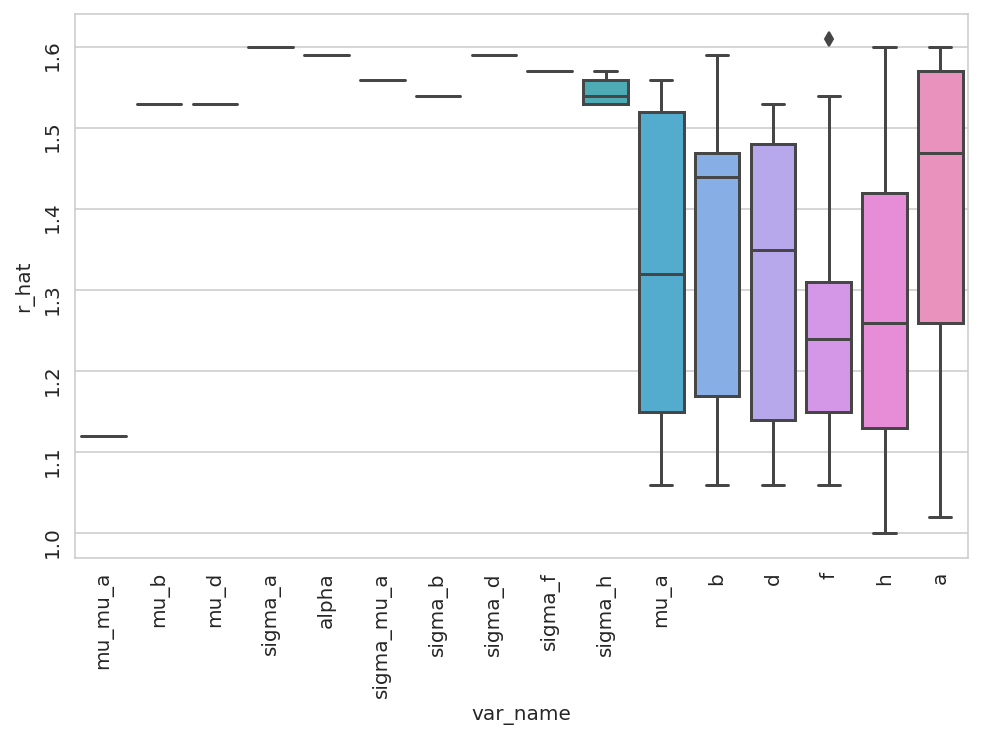

In [15]:
fig, ax = plt.subplots(figsize=(8, 5))
sns.boxplot(data=crc_post_summary, x="var_name", y="r_hat", ax=ax)
ax.tick_params(rotation=90)
plt.show()

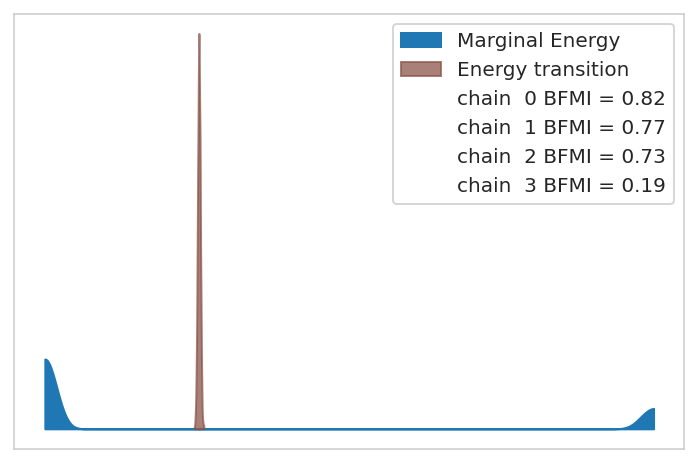

In [16]:
az.plot_energy(trace);

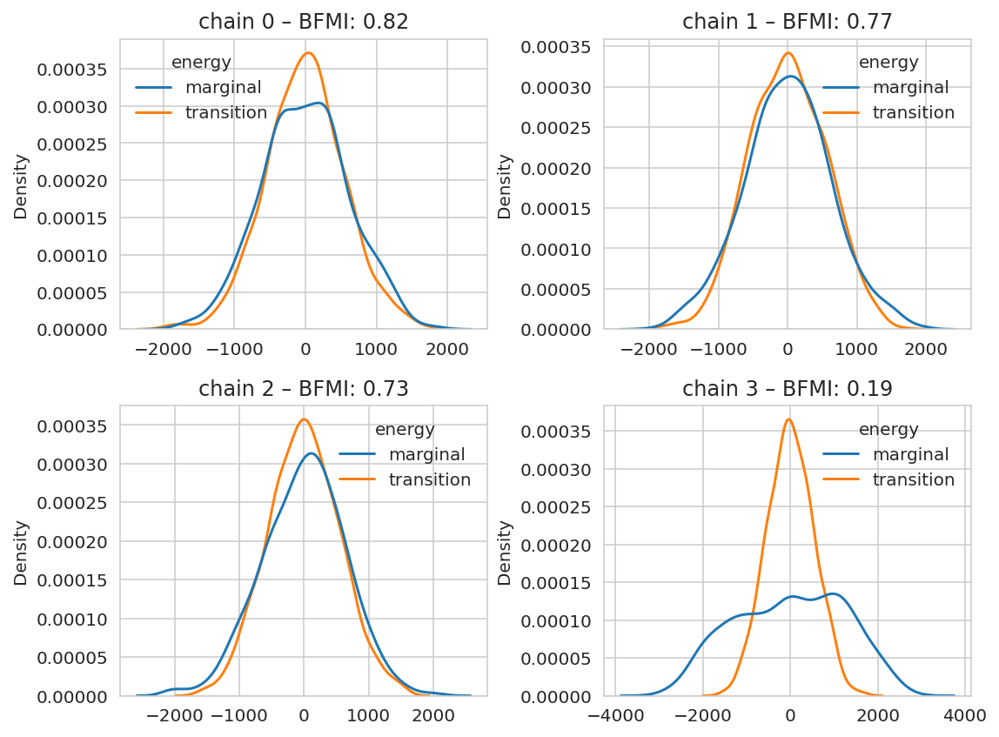

In [17]:
energy = trace.sample_stats.energy.values
marginal_e = pd.DataFrame((energy - energy.mean(axis=1)[:, None]).T).assign(
    energy="marginal"
)
transition_e = pd.DataFrame((energy[:, :-1] - energy[:, 1:]).T).assign(
    energy="transition"
)
energy_df = pd.concat([marginal_e, transition_e]).reset_index(drop=True)
bfmi = az.bfmi(trace)

fig, axes = plt.subplots(2, 2, figsize=(8, 6))
for i, ax in enumerate(axes.flatten()):
    sns.kdeplot(data=energy_df, x=i, hue="energy", ax=ax)
    ax.set_title(f"chain {i} – BFMI: {bfmi[i]:0.2f}")
    ax.set_xlabel(None)
    xmin, _ = ax.get_xlim()
    _, ymax = ax.get_ylim()
    ax.get_legend().set_frame_on(False)

fig.tight_layout()
plt.show()

In [18]:
stats = ["step_size", "n_steps", "tree_depth", "acceptance_rate", "energy"]
trace.sample_stats.get(stats).to_dataframe().groupby("chain").mean()

,step_size,n_steps,tree_depth,acceptance_rate,energy
chain,,,,,
0,0.007457,511.0,9.0,0.990548,1.912175e+07
1,0.007395,511.0,9.0,0.991426,1.912176e+07
2,0.007224,511.0,9.0,0.991748,1.912174e+07
3,0.000212,1023.0,10.0,0.979913,1.936050e+07


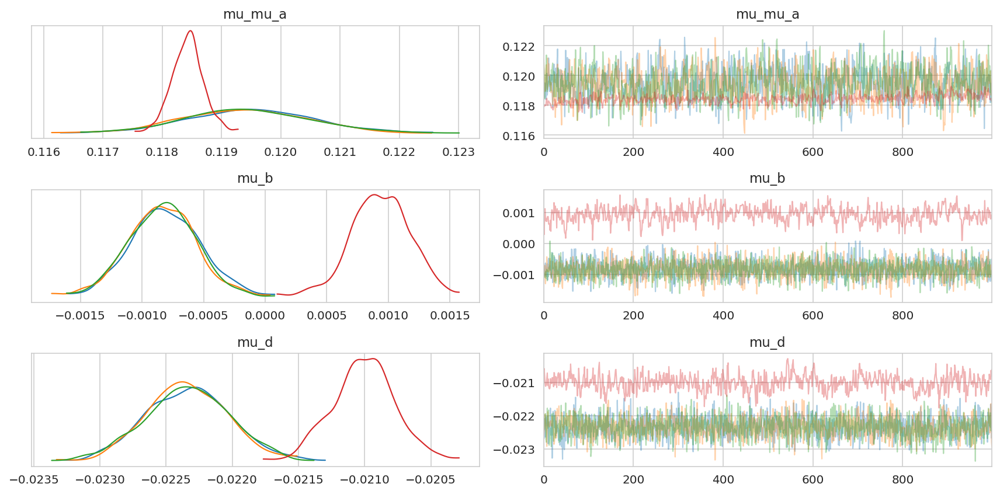

In [54]:
az.plot_trace(trace, var_names=["mu_mu_a", "mu_b", "mu_d"], compact=False)
plt.tight_layout()

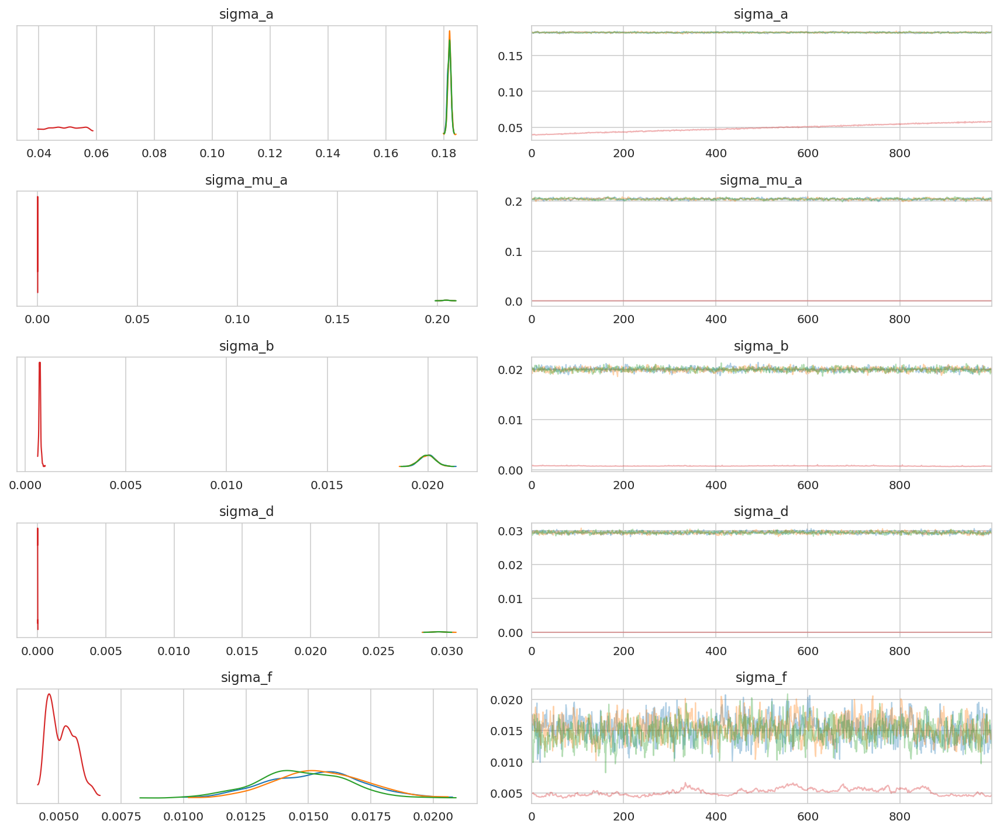

In [55]:
az.plot_trace(
    trace, var_names=[f"sigma_{x}" for x in ["a", "mu_a", "b", "d", "f"]], compact=False
)
plt.tight_layout()
plt.show()

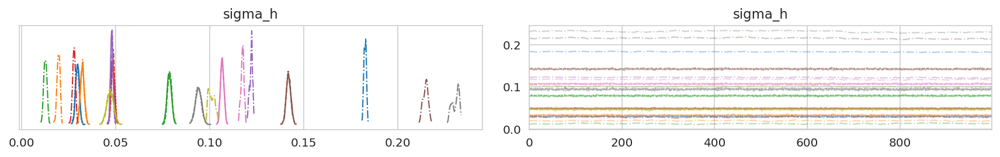

In [56]:
az.plot_trace(trace, var_names=["sigma_h"], compact=True)
plt.tight_layout()
plt.show()

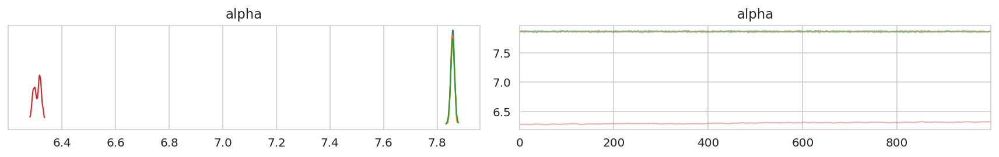

In [57]:
az.plot_trace(trace, var_names=["alpha"], compact=False)
plt.tight_layout()
plt.show()

In [19]:
HAPPY_CHAINS = [0, 1, 2]
SAD_CHAINS = [3]

In [20]:
trace.posterior = trace.posterior.sel({"chain": HAPPY_CHAINS})
trace.posterior_predictive = trace.posterior_predictive.sel({"chain": HAPPY_CHAINS})

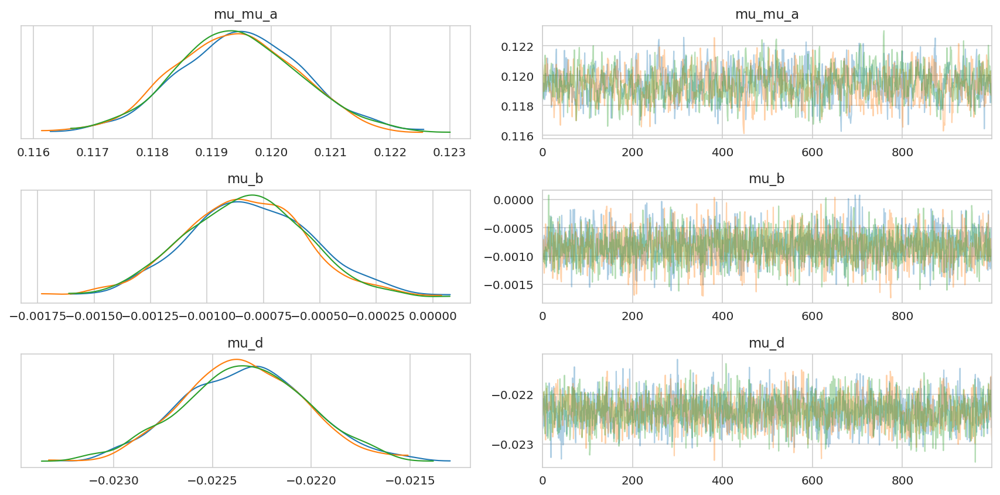

In [21]:
az.plot_trace(trace, var_names=["mu_mu_a", "mu_b", "mu_d"], compact=False)
plt.tight_layout()

In [22]:
az.summary(trace, var_names=["mu_mu_a", "mu_b", "mu_d"])

,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu_mu_a,0.119,0.001,0.118,0.121,0.0,0.0,1091.0,1974.0,1.0
mu_b,-0.001,0.000,-0.001,-0.000,0.0,0.0,3279.0,2570.0,1.0
mu_d,-0.022,0.000,-0.023,-0.022,0.0,0.0,2545.0,2292.0,1.0


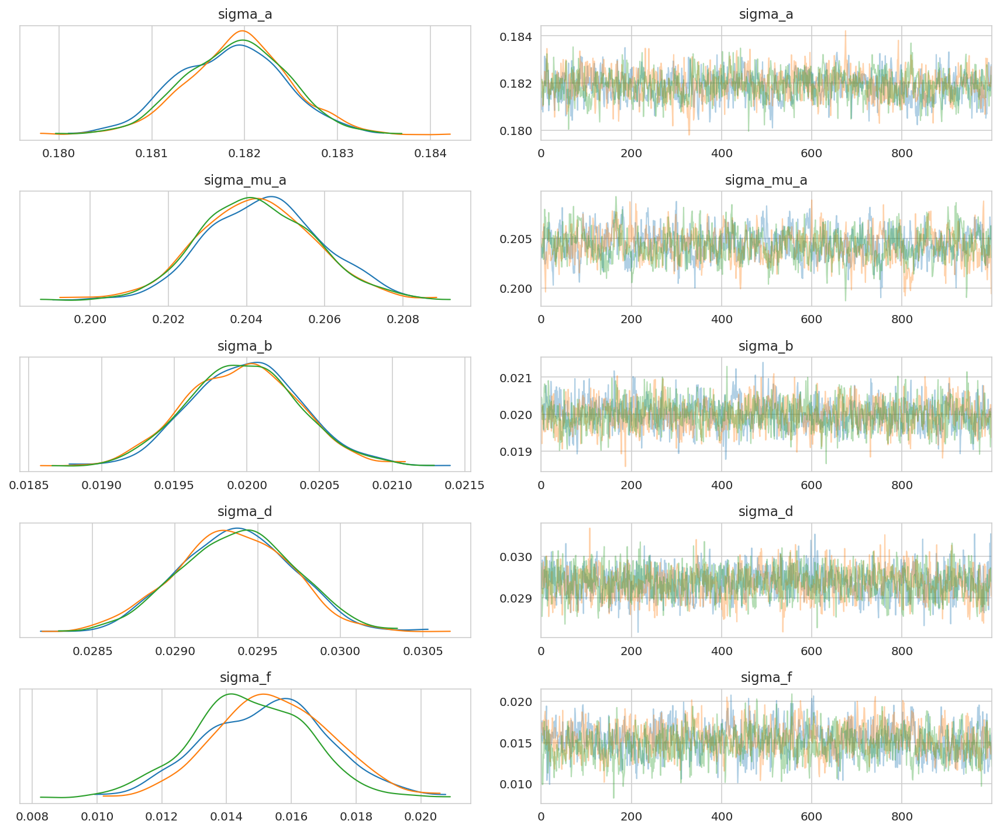

In [23]:
az.plot_trace(
    trace, var_names=[f"sigma_{x}" for x in ["a", "mu_a", "b", "d", "f"]], compact=False
)
plt.tight_layout()
plt.show()

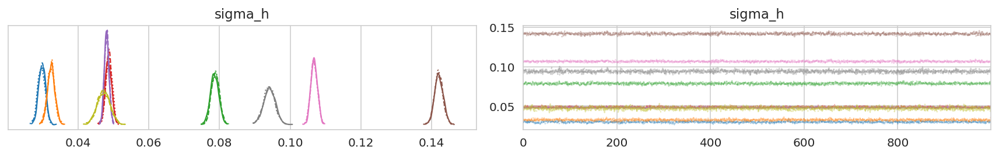

In [24]:
az.plot_trace(trace, var_names=["sigma_h"], compact=True)
plt.tight_layout()
plt.show()

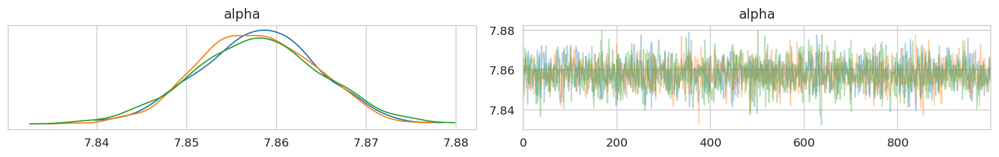

In [25]:
az.plot_trace(trace, var_names=["alpha"], compact=False)
plt.tight_layout()
plt.show()

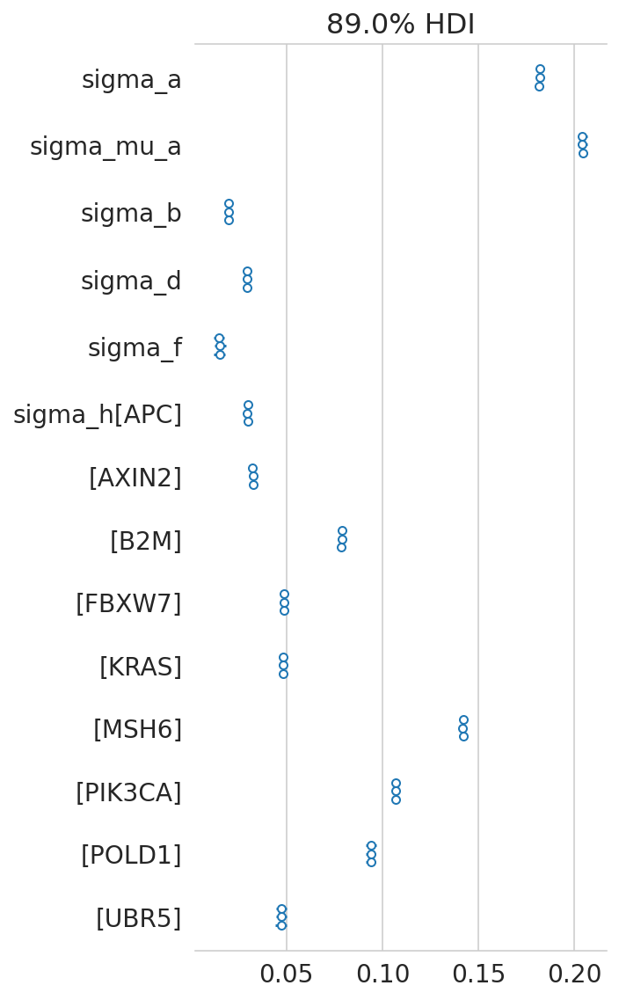

In [26]:
az.plot_forest(
    trace, var_names=["^sigma_*"], filter_vars="regex", combined=False, figsize=(5, 8)
)
plt.tight_layout()

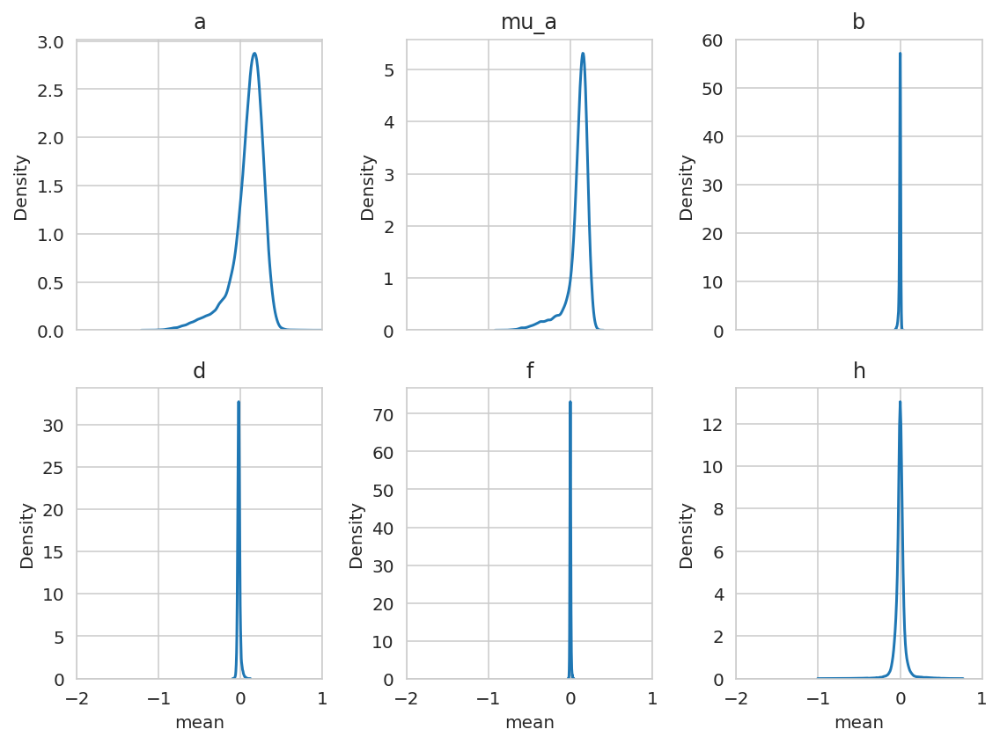

In [27]:
var_names = ["a", "mu_a", "b", "d", "f", "h"]
_, axes = plt.subplots(2, 3, figsize=(8, 6), sharex=True)
for ax, var_name in zip(axes.flatten(), var_names):
    x = crc_post_summary.query(f"var_name == '{var_name}'")["mean"]
    sns.kdeplot(x=x, ax=ax)
    ax.set_title(var_name)
    ax.set_xlim(-2, 1)

plt.tight_layout()
plt.show()

In [28]:
sgrna_to_gene_map = (
    crc_data.copy()[["hugo_symbol", "sgrna"]].drop_duplicates().reset_index(drop=True)
)

In [29]:
crc_post_summary.query("var_name == 'mu_a'").sort_values("mean").pipe(head_tail, 5)

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
12660,mu_a[RAN],-0.858,0.568,-1.264,0.119,0.281,0.215,7.0,20.0,1.54,mu_a
12332,mu_a[PSMD7],-0.769,0.517,-1.143,0.119,0.255,0.195,7.0,24.0,1.53,mu_a
7792,mu_a[KIF11],-0.741,0.501,-1.110,0.119,0.247,0.189,7.0,20.0,1.54,mu_a
11849,mu_a[POLR2L],-0.738,0.499,-1.105,0.119,0.246,0.188,7.0,20.0,1.54,mu_a
13322,mu_a[RPSA],-0.722,0.489,-1.080,0.119,0.242,0.185,7.0,17.0,1.55,mu_a
4844,mu_a[EQTN],0.322,0.137,0.118,0.474,0.059,0.044,7.0,23.0,1.53,mu_a
16407,mu_a[TRIQK],0.324,0.134,0.118,0.469,0.060,0.045,7.0,23.0,1.54,mu_a
10472,mu_a[OFD1],0.329,0.137,0.118,0.477,0.061,0.046,7.0,23.0,1.54,mu_a
17905,mu_a[ZNF611],0.337,0.142,0.118,0.488,0.064,0.048,7.0,24.0,1.54,mu_a
8819,mu_a[MAPK9],0.345,0.149,0.118,0.509,0.066,0.049,7.0,24.0,1.53,mu_a


In [30]:
crc_post_summary.query("var_name == 'b'").sort_values("mean").pipe(head_tail, 5)

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
31284,b[RNGTT],-0.068,0.042,-0.107,0.001,0.020,0.015,7.0,31.0,1.53,b
18806,b[ANKLE2],-0.067,0.041,-0.105,0.002,0.020,0.015,7.0,33.0,1.53,b
30883,b[RBM22],-0.063,0.040,-0.101,0.002,0.019,0.014,7.0,20.0,1.54,b
30419,b[PSMA6],-0.063,0.039,-0.101,0.001,0.018,0.014,7.0,32.0,1.53,b
30451,b[PSMD7],-0.061,0.039,-0.099,0.002,0.018,0.014,7.0,33.0,1.53,b
18748,b[AMIGO2],0.026,0.020,0.000,0.051,0.007,0.006,8.0,56.0,1.43,b
33737,b[TGFB1],0.026,0.019,0.001,0.050,0.007,0.005,8.0,95.0,1.41,b
33183,b[STON1],0.026,0.019,-0.000,0.050,0.007,0.006,8.0,37.0,1.47,b
20819,b[CDKN1C],0.033,0.023,-0.001,0.060,0.010,0.007,7.0,35.0,1.50,b
20817,b[CDKN1A],0.043,0.027,0.000,0.072,0.012,0.009,7.0,28.0,1.53,b


In [31]:
crc_post_summary.query("var_name == 'd'").sort_values("mean").pipe(head_tail, 5)

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
50218,d[SIK3],-0.090,0.044,-0.135,-0.020,0.020,0.015,7.0,34.0,1.53,d
38694,d[CCND1],-0.089,0.043,-0.133,-0.020,0.020,0.015,7.0,34.0,1.53,d
41087,d[ERBB2],-0.088,0.044,-0.136,-0.020,0.019,0.015,7.0,35.0,1.53,d
48547,d[PSMB5],-0.083,0.040,-0.125,-0.020,0.018,0.014,7.0,35.0,1.53,d
50106,d[SGK1],-0.074,0.036,-0.116,-0.020,0.016,0.012,7.0,37.0,1.51,d
43071,d[HNRNPK],0.081,0.062,-0.022,0.137,0.029,0.022,7.0,37.0,1.53,d
48080,d[POLR2D],0.082,0.062,-0.022,0.137,0.030,0.023,7.0,37.0,1.53,d
39248,d[CIAO3],0.083,0.063,-0.022,0.139,0.030,0.023,7.0,37.0,1.53,d
42214,d[GINS2],0.091,0.067,-0.022,0.150,0.032,0.025,7.0,37.0,1.53,d
47943,d[PLK1],0.114,0.080,-0.022,0.181,0.039,0.030,7.0,37.0,1.53,d


In [32]:
crc_post_summary.query("var_name == 'h'").sort_values("mean").pipe(head_tail, 5)

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
186277,"h[RAN, MSH6]",-0.986,0.101,-1.174,-0.869,0.045,0.035,7.0,14.0,1.58,h
192235,"h[RPSA, MSH6]",-0.907,0.121,-1.132,-0.778,0.056,0.043,7.0,11.0,1.59,h
111172,"h[DONSON, MSH6]",-0.904,0.099,-1.073,-0.789,0.044,0.034,7.0,13.0,1.57,h
178978,"h[POLR2L, MSH6]",-0.904,0.127,-1.122,-0.768,0.059,0.045,7.0,27.0,1.53,h
191290,"h[RPL12, MSH6]",-0.884,0.171,-1.190,-0.719,0.082,0.063,7.0,33.0,1.53,h
178980,"h[POLR2L, POLD1]",0.697,0.291,0.476,1.212,0.144,0.111,7.0,41.0,1.53,h
186278,"h[RAN, PIK3CA]",0.698,0.064,0.583,0.780,0.026,0.019,7.0,12.0,1.55,h
192237,"h[RPSA, POLD1]",0.721,0.266,0.508,1.199,0.131,0.101,7.0,12.0,1.58,h
111174,"h[DONSON, POLD1]",0.724,0.238,0.537,1.151,0.117,0.090,7.0,17.0,1.57,h
186279,"h[RAN, POLD1]",0.748,0.272,0.537,1.251,0.134,0.103,7.0,13.0,1.59,h


In [33]:
def _md_bold(s: str) -> None:
    display(Markdown(f"**{s}**"))

**KRAS**

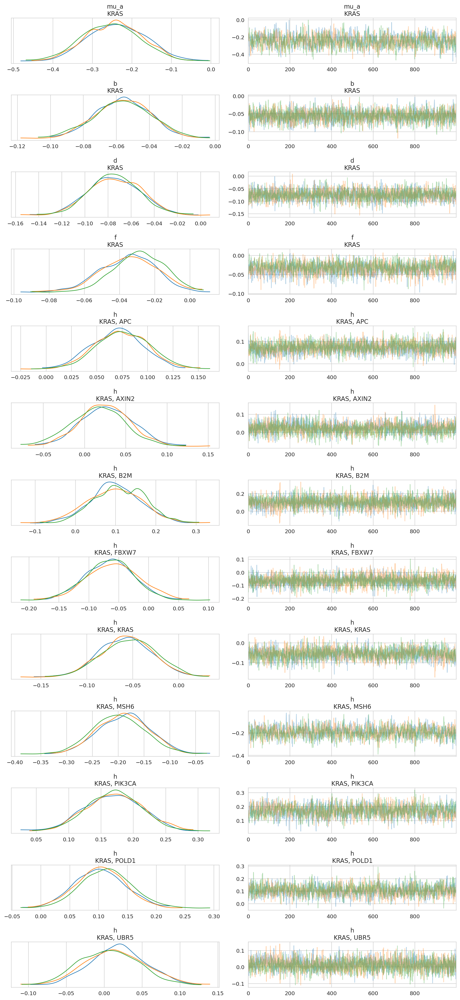

**APC**

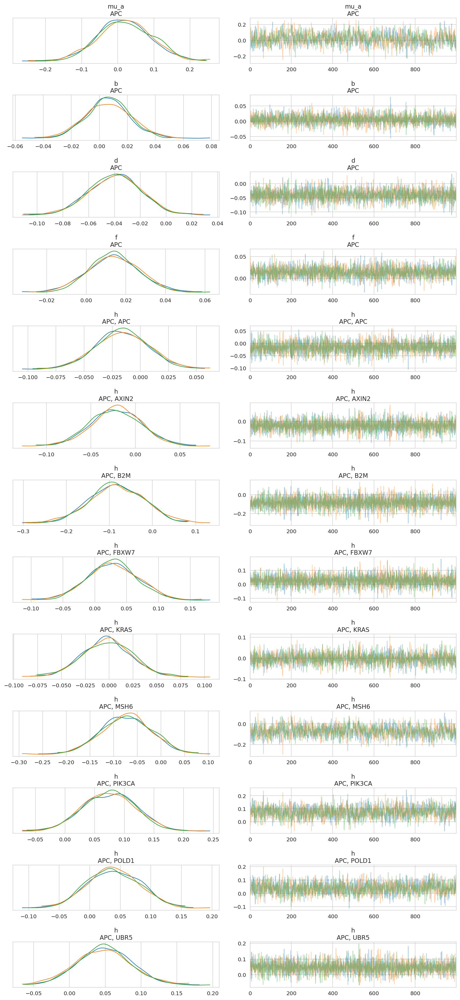

In [34]:
example_genes = ["KRAS", "APC"]
for gene in example_genes:
    _md_bold(gene)
    az.plot_trace(
        trace,
        var_names=["mu_a", "b", "d", "f", "h"],
        coords={"gene": [gene]},
        compact=False,
    )
    plt.tight_layout()
    plt.show()

**KRAS**

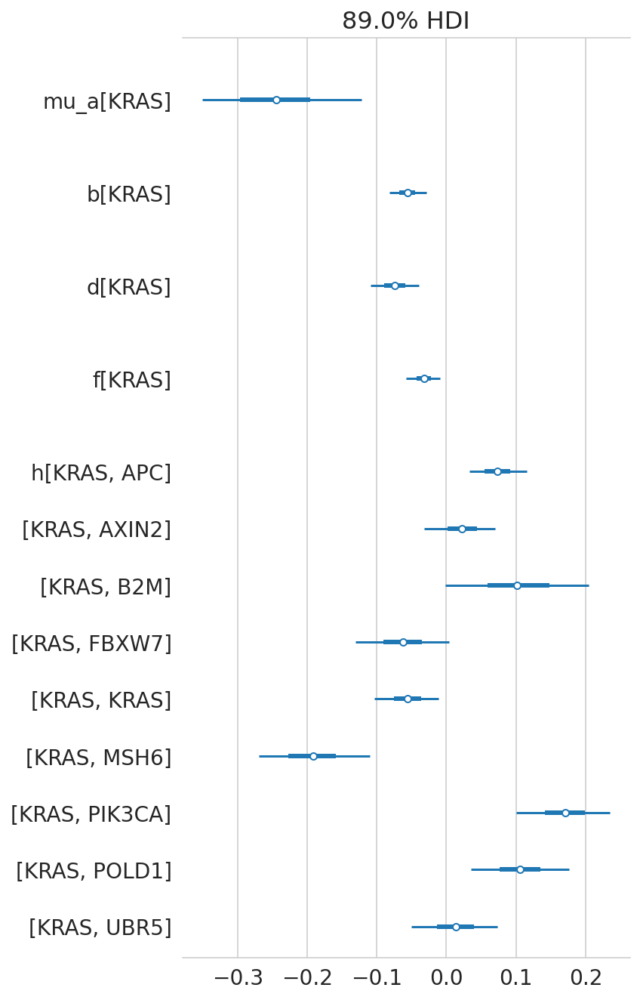

**APC**

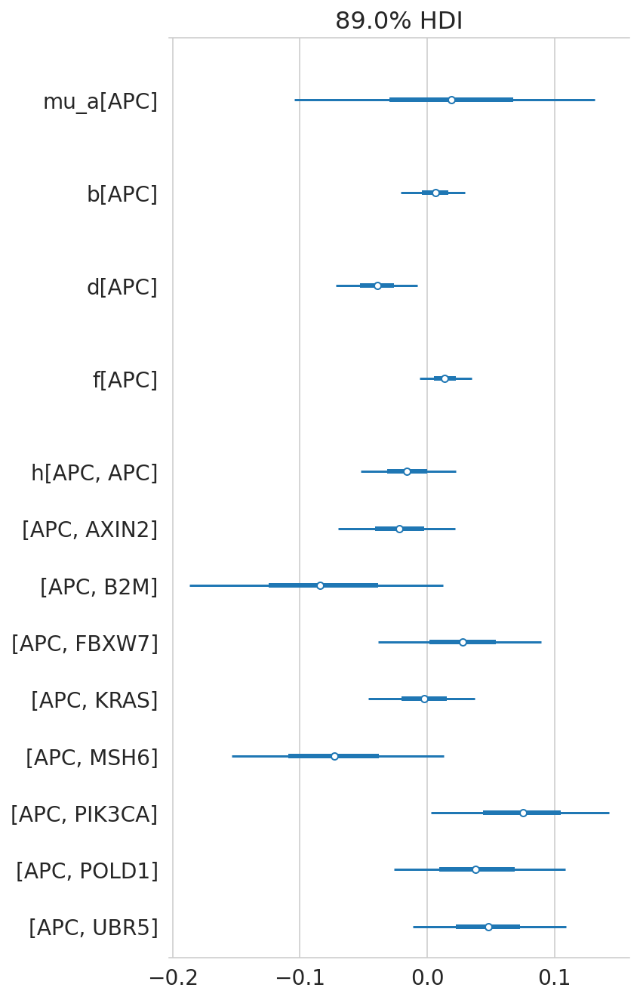

In [35]:
example_genes = ["KRAS", "APC"]
for gene in example_genes:
    _md_bold(gene)
    az.plot_forest(
        trace,
        var_names=["mu_a", "b", "d", "f", "h"],
        coords={"gene": [gene]},
        combined=True,
    )
    plt.tight_layout()
    plt.show()

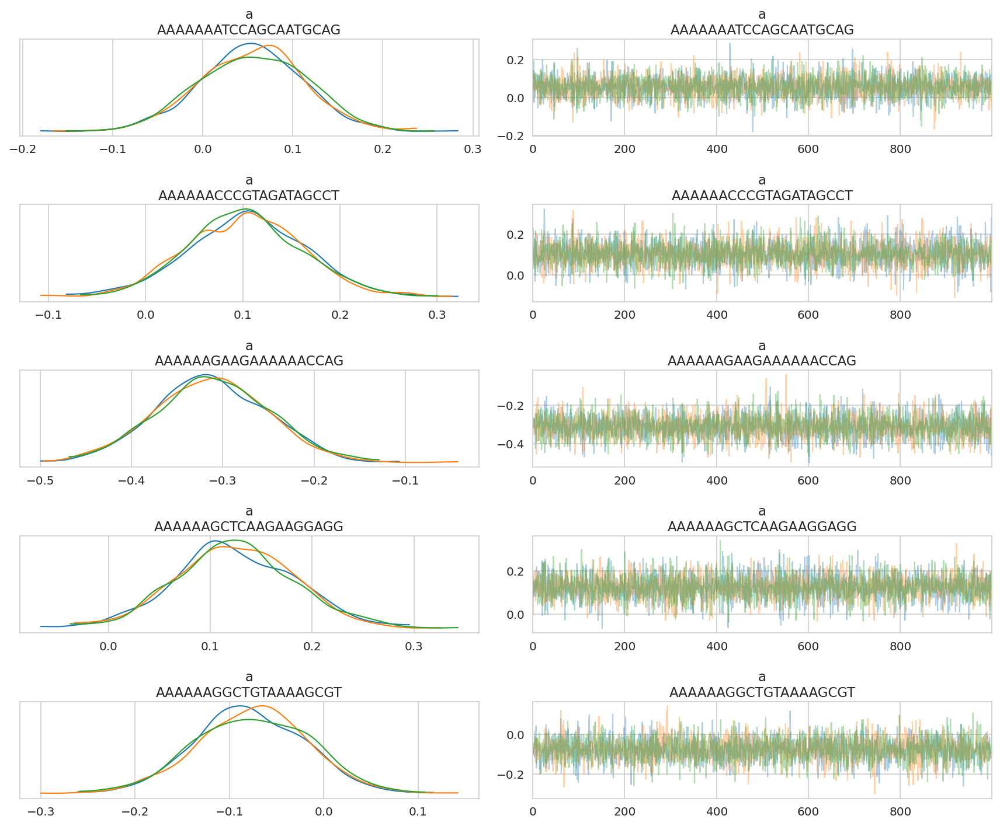

In [36]:
sgrnas_sample = trace.posterior.coords["sgrna"].values[:5]

az.plot_trace(trace, var_names="a", coords={"sgrna": sgrnas_sample}, compact=False)
plt.tight_layout()
plt.show()

In [37]:
az.summary(trace, var_names="a", coords={"sgrna": sgrnas_sample})

,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a[AAAAAAATCCAGCAATGCAG],0.055,0.058,-0.034,0.150,0.001,0.001,5413.0,2427.0,1.0
a[AAAAAACCCGTAGATAGCCT],0.103,0.060,0.002,0.192,0.001,0.001,5665.0,2414.0,1.0
a[AAAAAAGAAGAAAAAACCAG],-0.312,0.062,-0.411,-0.215,0.001,0.001,5208.0,2460.0,1.0
a[AAAAAAGCTCAAGAAGGAGG],0.125,0.058,0.032,0.213,0.001,0.001,5538.0,2579.0,1.0
a[AAAAAAGGCTGTAAAAGCGT],-0.076,0.060,-0.171,0.017,0.001,0.001,4838.0,2575.0,1.0


In [38]:
crc_post_summary.filter_string("var_name", "^sigma_*")

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
3,sigma_a,0.149,0.058,0.048,0.184,0.029,0.022,7.0,11.0,1.60,sigma_a
5,sigma_mu_a,0.153,0.088,0.000,0.206,0.044,0.034,7.0,22.0,1.56,sigma_mu_a
6,sigma_b,0.015,0.008,0.001,0.020,0.004,0.003,7.0,21.0,1.54,sigma_b
7,sigma_d,0.022,0.013,0.000,0.030,0.006,0.005,7.0,12.0,1.59,sigma_d
8,sigma_f,0.013,0.005,0.004,0.017,0.002,0.002,7.0,27.0,1.57,sigma_f
9,sigma_h[APC],0.068,0.066,0.028,0.183,0.033,0.025,7.0,19.0,1.57,sigma_h
10,sigma_h[AXIN2],0.029,0.006,0.019,0.034,0.003,0.002,7.0,39.0,1.53,sigma_h
11,sigma_h[B2M],0.062,0.029,0.012,0.080,0.014,0.011,7.0,53.0,1.54,sigma_h
12,sigma_h[FBXW7],0.044,0.009,0.028,0.050,0.004,0.003,7.0,38.0,1.54,sigma_h
13,sigma_h[KRAS],0.067,0.032,0.047,0.123,0.016,0.012,7.0,23.0,1.56,sigma_h


In [39]:
genes_var_names = ["mu_a", "b", "d", "f"]
genes_var_names += [f"h[{g}]" for g in trace.posterior.coords["cancer_gene"].values]
gene_corr_post = (
    az.summary(trace, "genes_chol_cov_corr", kind="stats")
    .pipe(extract_coords_param_names, names=["d1", "d2"])
    .astype({"d1": int, "d2": int})
    .assign(
        p1=lambda d: [genes_var_names[i] for i in d["d1"]],
        p2=lambda d: [genes_var_names[i] for i in d["d2"]],
    )
    .assign(
        p1=lambda d: pd.Categorical(d["p1"], categories=d["p1"].unique(), ordered=True)
    )
    .assign(
        p2=lambda d: pd.Categorical(
            d["p2"], categories=d["p1"].cat.categories, ordered=True
        )
    )
)
gene_corr_post

,mean,sd,hdi_5.5%,hdi_94.5%,d1,d2,p1,p2
"genes_chol_cov_corr[0, 0]",1.000,0.000,1.000,1.000,0,0,mu_a,mu_a
"genes_chol_cov_corr[0, 1]",0.508,0.016,0.482,0.532,0,1,mu_a,b
"genes_chol_cov_corr[0, 2]",-0.372,0.012,-0.392,-0.354,0,2,mu_a,d
"genes_chol_cov_corr[0, 3]",-0.234,0.076,-0.352,-0.112,0,3,mu_a,f
"genes_chol_cov_corr[0, 4]",-0.330,0.022,-0.365,-0.294,0,4,mu_a,h[APC]
...,...,...,...,...,...,...,...,...
"genes_chol_cov_corr[12, 8]",-0.427,0.038,-0.490,-0.368,12,8,h[UBR5],h[KRAS]
"genes_chol_cov_corr[12, 9]",-0.340,0.032,-0.395,-0.293,12,9,h[UBR5],h[MSH6]
"genes_chol_cov_corr[12, 10]",0.454,0.033,0.404,0.508,12,10,h[UBR5],h[PIK3CA]
"genes_chol_cov_corr[12, 11]",0.176,0.042,0.107,0.241,12,11,h[UBR5],h[POLD1]


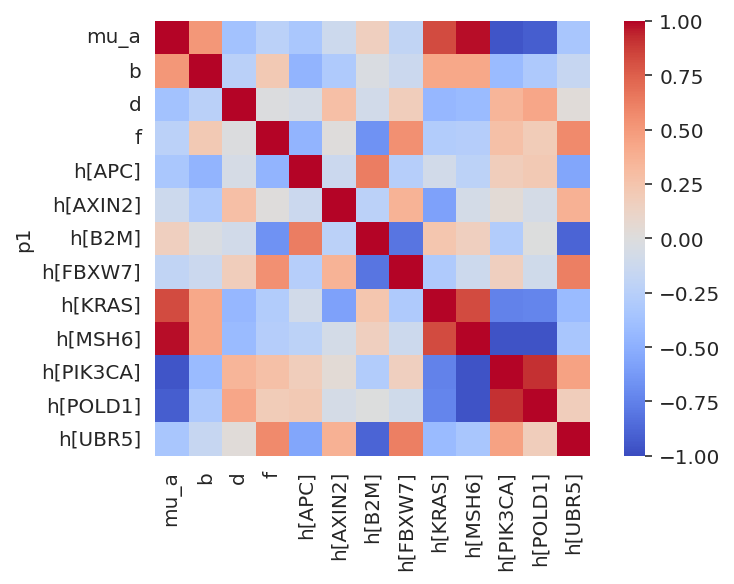

In [40]:
plot_df = gene_corr_post.pivot_wider("p1", "p2", "mean").set_index("p1")
sns.heatmap(plot_df, cmap="coolwarm", vmin=-1, vmax=1, square=True)
plt.show()

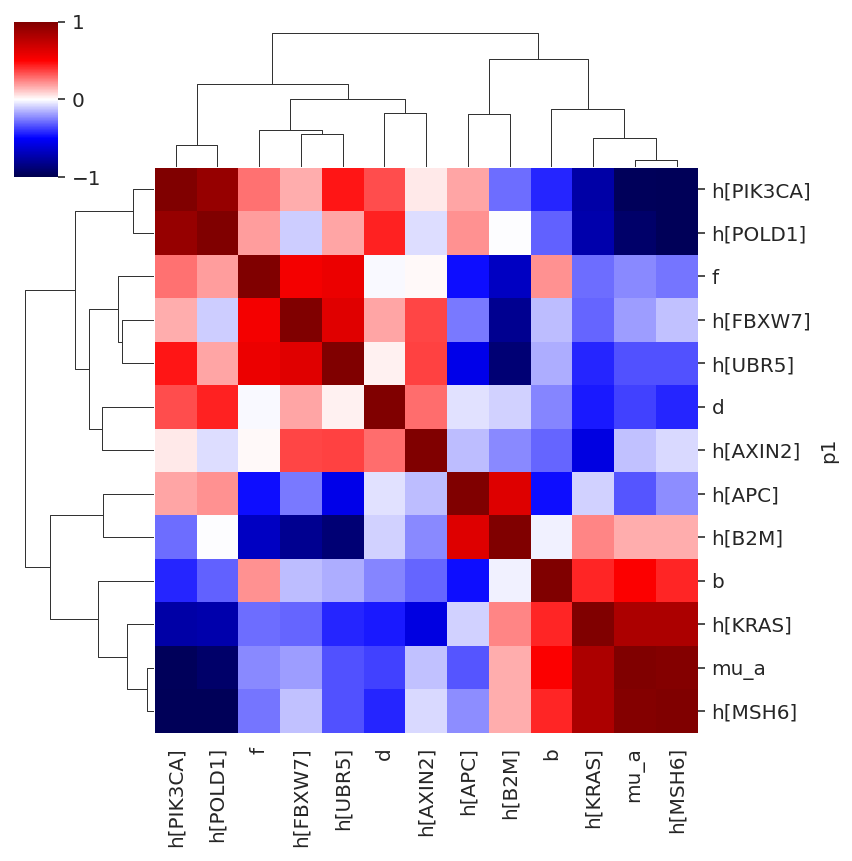

In [41]:
plot_df = gene_corr_post.pivot_wider("p1", "p2", "mean").set_index("p1")
sns.clustermap(plot_df, cmap="seismic", vmin=-1, vmax=1, figsize=(6, 6))
plt.show()

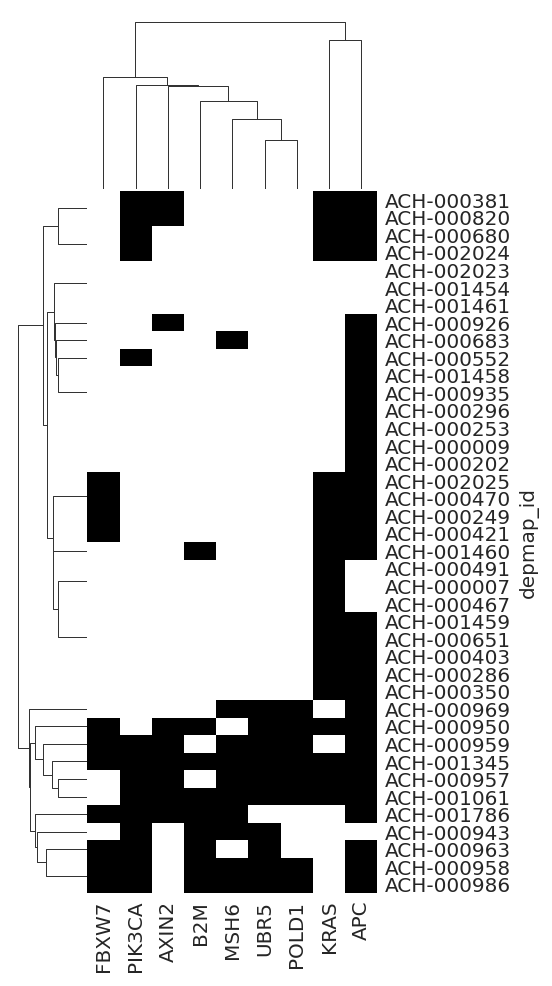

In [42]:
cancer_genes = trace.posterior.coords["cancer_gene"].values.tolist()
cancer_gene_mutants = (
    valid_crc_data.filter_column_isin("hugo_symbol", cancer_genes)[
        ["hugo_symbol", "depmap_id", "is_mutated"]
    ]
    .drop_duplicates()
    .pivot_wider("depmap_id", names_from="hugo_symbol", values_from="is_mutated")
    .set_index("depmap_id")
)
cg = sns.clustermap(
    cancer_gene_mutants, cmap="Greys", xticklabels=1, yticklabels=1, figsize=(4, 7)
)
cg.ax_heatmap.tick_params("both", length=0)
cg.ax_cbar.remove()
plt.show()

In [43]:
h_post_summary = (
    crc_post_summary.query("var_name == 'h'")
    .reset_index(drop=True)
    .pipe(
        extract_coords_param_names,
        names=["hugo_symbol", "cancer_gene"],
        col="parameter",
    )
)
h_post_summary.head()

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name,hugo_symbol,cancer_gene
0,"h[A1BG, APC]",0.011,0.039,-0.050,0.068,0.015,0.012,9.0,11.0,1.35,h,A1BG,APC
1,"h[A1BG, AXIN2]",0.005,0.024,-0.030,0.045,0.003,0.002,60.0,1993.0,1.16,h,A1BG,AXIN2
2,"h[A1BG, B2M]",-0.014,0.052,-0.105,0.067,0.005,0.006,122.0,1119.0,1.34,h,A1BG,B2M
3,"h[A1BG, FBXW7]",0.018,0.035,-0.028,0.079,0.008,0.005,23.0,1431.0,1.11,h,A1BG,FBXW7
4,"h[A1BG, KRAS]",0.027,0.035,-0.017,0.092,0.013,0.011,9.0,12.0,1.38,h,A1BG,KRAS


In [44]:
h_post_summary.sort_values("mean").pipe(head_tail, n=5)

,parameter,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name,hugo_symbol,cancer_gene
113783,"h[RAN, MSH6]",-0.986,0.101,-1.174,-0.869,0.045,0.035,7.0,14.0,1.58,h,RAN,MSH6
119741,"h[RPSA, MSH6]",-0.907,0.121,-1.132,-0.778,0.056,0.043,7.0,11.0,1.59,h,RPSA,MSH6
38678,"h[DONSON, MSH6]",-0.904,0.099,-1.073,-0.789,0.044,0.034,7.0,13.0,1.57,h,DONSON,MSH6
106484,"h[POLR2L, MSH6]",-0.904,0.127,-1.122,-0.768,0.059,0.045,7.0,27.0,1.53,h,POLR2L,MSH6
118796,"h[RPL12, MSH6]",-0.884,0.171,-1.190,-0.719,0.082,0.063,7.0,33.0,1.53,h,RPL12,MSH6
106486,"h[POLR2L, POLD1]",0.697,0.291,0.476,1.212,0.144,0.111,7.0,41.0,1.53,h,POLR2L,POLD1
113784,"h[RAN, PIK3CA]",0.698,0.064,0.583,0.780,0.026,0.019,7.0,12.0,1.55,h,RAN,PIK3CA
119743,"h[RPSA, POLD1]",0.721,0.266,0.508,1.199,0.131,0.101,7.0,12.0,1.58,h,RPSA,POLD1
38680,"h[DONSON, POLD1]",0.724,0.238,0.537,1.151,0.117,0.090,7.0,17.0,1.57,h,DONSON,POLD1
113785,"h[RAN, POLD1]",0.748,0.272,0.537,1.251,0.134,0.103,7.0,13.0,1.59,h,RAN,POLD1


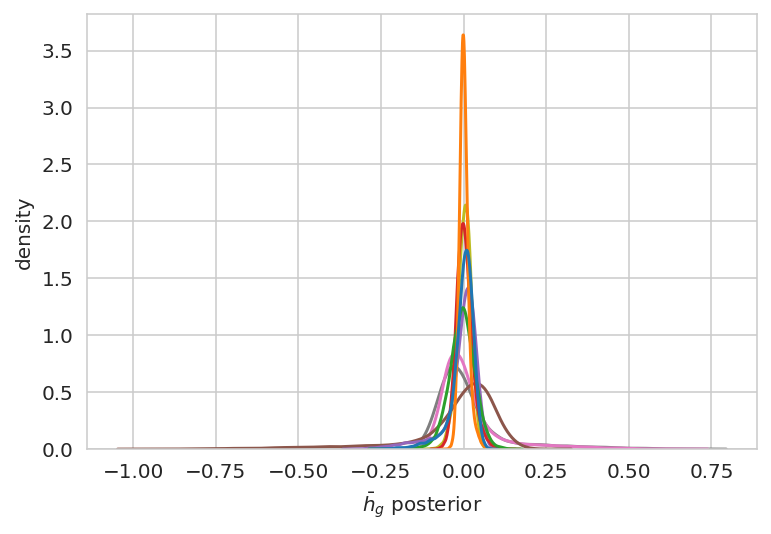

In [45]:
ax = sns.kdeplot(data=h_post_summary, x="mean", hue="cancer_gene")
ax.set_xlabel(r"$\bar{h}_g$ posterior")
ax.set_ylabel("density")
ax.get_legend().remove()  # set_title("cancer gene\ncomut.")
plt.show()

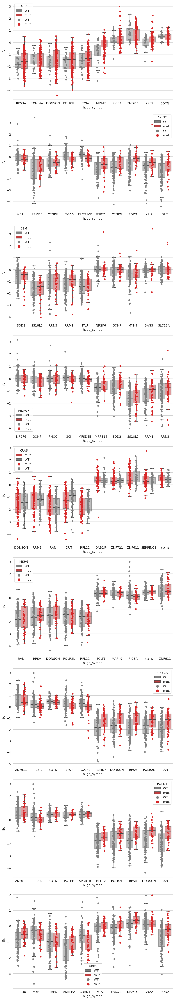

In [46]:
fig, axes = plt.subplots(
    len(cancer_genes), 1, squeeze=False, figsize=(8, len(cancer_genes) * 5)
)
for ax, cg in zip(axes.flatten(), cancer_genes):
    h_hits = (
        h_post_summary.filter_column_isin("cancer_gene", [cg])
        .sort_values("mean")
        .pipe(head_tail, n=5)["hugo_symbol"]
        .tolist()
    )

    h_hits_data = (
        valid_crc_data.filter_column_isin("hugo_symbol", h_hits)
        .merge(cancer_gene_mutants.reset_index(), on="depmap_id")
        .reset_index()
        .astype({"hugo_symbol": str})
        .assign(
            hugo_symbol=lambda d: pd.Categorical(d["hugo_symbol"], categories=h_hits),
            _cg_mut=lambda d: d[cg].map({True: "mut.", False: "WT"}),
        )
    )
    mut_pal = {"mut.": "tab:red", "WT": "gray"}
    sns.boxplot(
        data=h_hits_data,
        x="hugo_symbol",
        y="lfc",
        hue="_cg_mut",
        palette=mut_pal,
        ax=ax,
        showfliers=False,
        boxprops={"alpha": 0.5},
    )
    sns.stripplot(
        data=h_hits_data,
        x="hugo_symbol",
        y="lfc",
        hue="_cg_mut",
        dodge=True,
        palette=mut_pal,
        ax=ax,
    )
    ax.get_legend().set_title(cg)

plt.tight_layout()
plt.show()

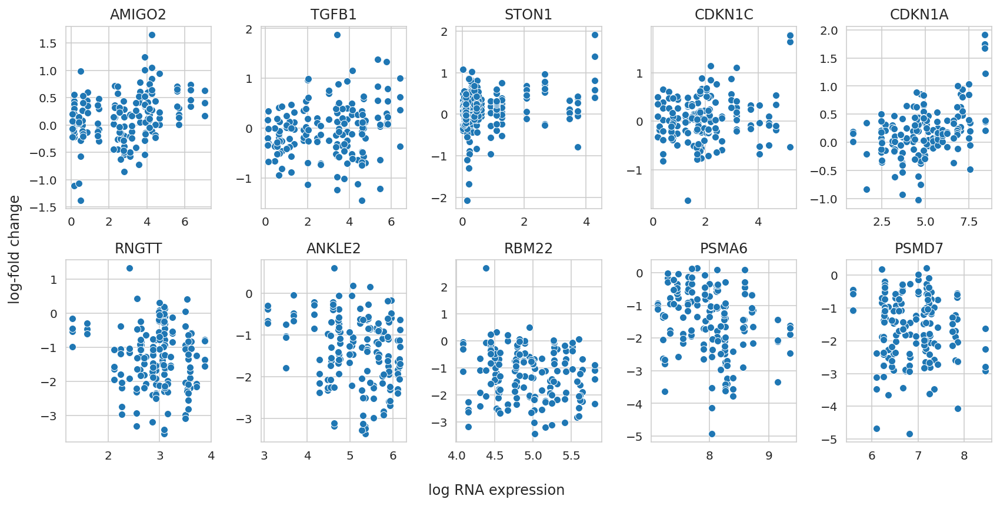

In [47]:
top_n = 5
top_b_hits = (
    crc_post_summary.query("var_name == 'b'")
    .sort_values("mean")
    .reset_index(drop=True)
    .pipe(extract_coords_param_names, names=["hugo_symbol"], col="parameter")
    .pipe(head_tail, n=top_n)
)

negative_b = top_b_hits["hugo_symbol"][:top_n].values
positive_b = top_b_hits["hugo_symbol"][top_n:].values


fig, axes = plt.subplots(2, top_n, figsize=(12, 6))

for i, genes in enumerate([positive_b, negative_b]):
    for j, gene in enumerate(genes):
        ax = axes[i, j]
        ax.set_title(gene)
        obs_data = crc_data.query(f"hugo_symbol == '{gene}'")
        sns.scatterplot(data=obs_data, x="rna_expr", y="lfc", ax=ax)
        ax.set_xlabel(None)
        ax.set_ylabel(None)


fig.supxlabel("log RNA expression")
fig.supylabel("log-fold change")

fig.tight_layout()
plt.show()

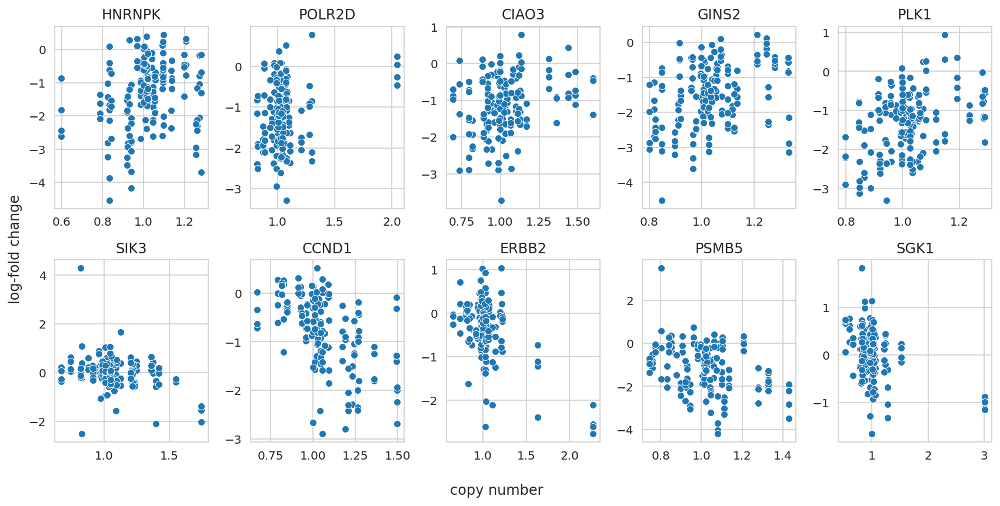

In [48]:
top_n = 5
top_d_hits = (
    crc_post_summary.query("var_name == 'd'")
    .sort_values("mean")
    .reset_index(drop=True)
    .pipe(extract_coords_param_names, names=["hugo_symbol"], col="parameter")
    .pipe(head_tail, n=top_n)
)

negative_d = top_d_hits["hugo_symbol"][:top_n].values
positive_d = top_d_hits["hugo_symbol"][top_n:].values


fig, axes = plt.subplots(2, top_n, figsize=(12, 6))

for i, genes in enumerate([positive_d, negative_d]):
    for j, gene in enumerate(genes):
        ax = axes[i, j]
        ax.set_title(gene)
        obs_data = crc_data.query(f"hugo_symbol == '{gene}'")
        sns.scatterplot(data=obs_data, x="copy_number", y="lfc", ax=ax)
        ax.set_xlabel(None)
        ax.set_ylabel(None)


fig.supxlabel("copy number")
fig.supylabel("log-fold change")
fig.tight_layout()
plt.show()

## PPC

In [49]:
np.random.seed(99)
n_examples = 40
n_chains, n_draws, n_data = trace.posterior_predictive["ct_final"].shape
ex_draws_idx = np.random.choice(
    np.arange(n_draws), size=n_examples // n_chains, replace=False
)
example_ppc_draws = trace.posterior_predictive["ct_final"][
    :, ex_draws_idx, :
].values.reshape(-1, n_data)
example_ppc_draws.shape

(39, 2842455)

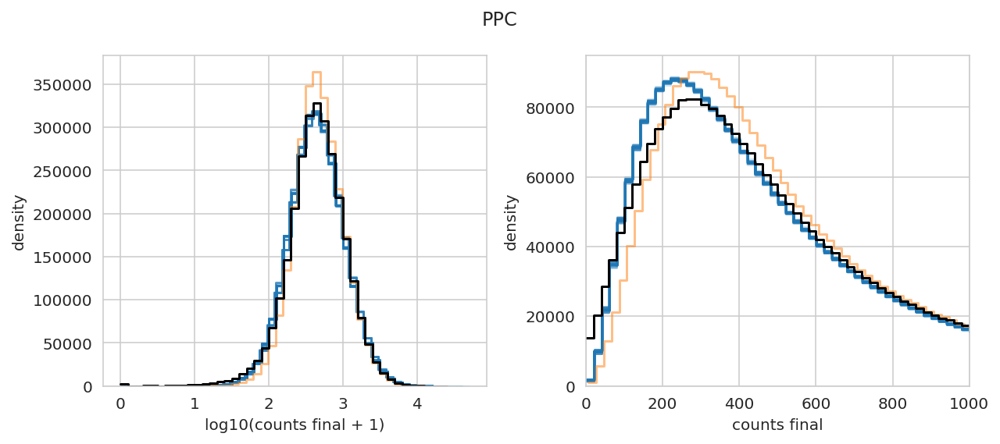

In [50]:
fig, axes = plt.subplots(ncols=2, figsize=(9, 4), sharex=False, sharey=False)
ax1 = axes[0]
ax2 = axes[1]
hist_kwargs = {"stat": "count", "element": "step", "fill": False}

pp_avg = trace.posterior_predictive["ct_final"].mean(axis=(0, 1))

bw = 0.1
for i in range(example_ppc_draws.shape[0]):
    sns.histplot(
        x=np.log10(example_ppc_draws[i, :] + 1),
        alpha=0.2,
        binwidth=bw,
        color="tab:blue",
        ax=ax1,
        **hist_kwargs,
    )

sns.histplot(
    x=np.log10(pp_avg + 1),
    color="tab:orange",
    binwidth=bw,
    ax=ax1,
    alpha=0.5,
    **hist_kwargs,
)
sns.histplot(
    x=np.log10(valid_crc_data["counts_final"] + 1),
    color="k",
    binwidth=bw,
    ax=ax1,
    **hist_kwargs,
)
ax1.set_xlabel("log10(counts final + 1)")
ax1.set_ylabel("density")

bw = 20
for i in range(example_ppc_draws.shape[0]):
    sns.histplot(
        x=example_ppc_draws[i, :],
        alpha=0.2,
        binwidth=bw,
        color="tab:blue",
        ax=ax2,
        **hist_kwargs,
    )

sns.histplot(
    x=pp_avg, color="tab:orange", alpha=0.5, ax=ax2, binwidth=bw, **hist_kwargs
)
sns.histplot(
    x=valid_crc_data["counts_final"], color="k", binwidth=bw, ax=ax2, **hist_kwargs
)
ax2.set_xlabel("counts final")
ax2.set_ylabel("density")
ax2.set_xlim(0, 1000)

fig.suptitle("PPC")
fig.tight_layout()
plt.show()

---

## Session info

In [51]:
notebook_toc = time()
print(f"execution time: {(notebook_toc - notebook_tic) / 60:.2f} minutes")

execution time: 14.32 minutes


In [52]:
%load_ext watermark
%watermark -d -u -v -iv -b -h -m

Last updated: 2022-08-02

Python implementation: CPython
Python version       : 3.10.5
IPython version      : 8.4.0

Compiler    : GCC 10.3.0
OS          : Linux
Release     : 3.10.0-1160.71.1.el7.x86_64
Machine     : x86_64
Processor   : x86_64
CPU cores   : 32
Architecture: 64bit

Hostname: compute-a-16-44.o2.rc.hms.harvard.edu

Git branch: simplify

arviz     : 0.12.1
pandas    : 1.4.3
seaborn   : 0.11.2
numpy     : 1.22.4
matplotlib: 3.5.2

